## Scale-free networks by preferential attachment

1. The initial network topology is an arbitrary graph made of $m_0$ nodes. There is no specific requirement for its shape, as long as each node has at least one connection (so its degree is positive).

2. In each network growth event, a newcomer node is attached to the network by $m$ edges $(m \leq m_0)$. The destination of each edge is selected from the network of existing nodes using the following selection probabilities:

$$p(i) = \frac{\deg(i)}{\sum_j\deg(j)}$$

Here $p(i)$ is the probability for an existing node $i$ to be connected by a newcomer node, which is proportional to its degree (preferential attachment).

---
This preferential attachment mechanism captures **“the rich get richer”** effect in the growth of systems, which is often seen in many socio-economical, ecological, and physical processes. Such cumulative advantage is also called the “Matthew effect” in sociology.

What Barabasi and Albert found was that the network growing with this simple dynamical rule will eventually form a certain type of topology in which **the distribution of the node degrees follows a power law**

$$P(k)\sim k^{-\gamma}$$

where $P(k)$ is the probability for a node to have degree $k$, and $-\gamma$ is the scaling exponent.

---
This is because a power law distribution has a long tail (also called a fat tail, heavy tail, etc.), in which the probability goes down much more slowly than in the tail of a normal distribution as $k$ gets larger. Barabasi and Albert called networks whose degree distributions follow a power law scale-free networks, because there is no characteristic “scale” that stands out in their degree distributions.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn')

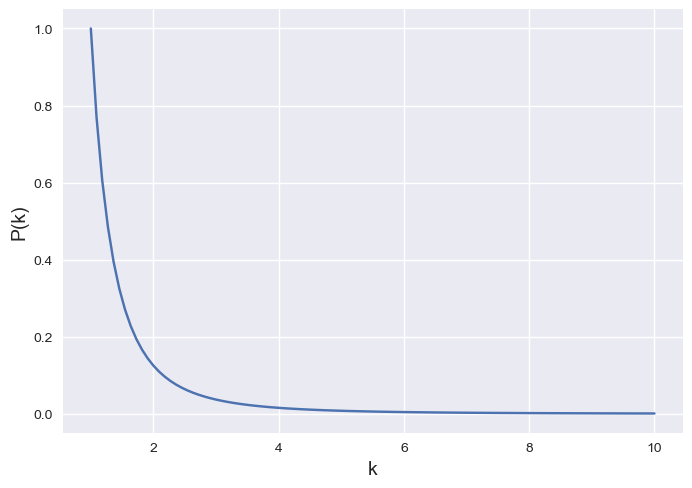

In [2]:
k = np.linspace(1, 10, 100)
power_law = lambda k, gamma: k**(-gamma)

plt.plot(k, power_law(k, 3))
plt.ylabel('P(k)', fontsize=14)
plt.xlabel('k', fontsize=14);

In [3]:
import numpy as np
import networkx as nx
import random
import matplotlib.pyplot as plt

In [4]:
from matplotlib import animation
from matplotlib import rc
rc('animation', html='html5')

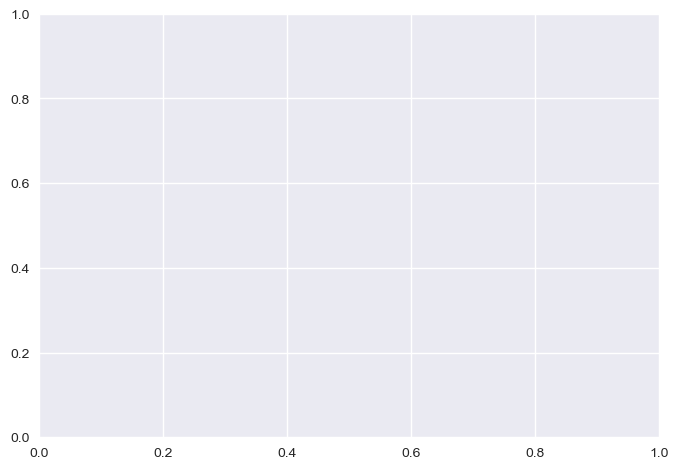

In [5]:
m0 = 10 # number of nodes in initial condition
m = 2 # number of edges per new node

g = nx.complete_graph(m0)
g.pos = nx.spring_layout(g)
g.count = 0

# Initial drawing
plt.cla()
fig, ax = plt.subplots(figsize=(8, 8))
plt.close()


# simulate

def pref_select(nds):
    global g
    r = np.random.uniform(0, sum(g.degree(i) for i in nds))
    x = 0
    for i in nds:
        x += g.degree(i)
        if r <= x:
            return i

def animate(frame):
    global g
    ax.clear()
    g.count += 1
    
    if g.count % 20 == 0: # rewiring once in every 20 steps
        nds = list(g.nodes()) 
        newcomer = max(nds) + 1
        
        for i in range(m):
            j = pref_select(nds)
            g.add_edge(newcomer, j)
            nds.remove(j)
            
        g.pos[newcomer] = (0, 0)
        
    g.pos = nx.spring_layout(g, pos = g.pos, iterations = 5)
    
    plt.cla()
    nx.draw(g, pos = g.pos, ax=ax, node_color='black', node_size=10)
    plt.close()

In [6]:
anim = animation.FuncAnimation(fig, animate, frames=500, interval=200)

In [7]:
anim